In [32]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.subplots as sp
import plotly.graph_objects as go

In [12]:
df = pd.read_csv('city_wise_hourly_sales.csv')

In [13]:
df.head(10)

,hour_of_day,city,product,qty_sold,city_hour_sales,product_rank
0,12AM-1AM,Agra,13202 - Maaza Tetrapack Rs 10,11,59,1
1,12AM-1AM,Agra,12954 - Cadbury Dairy Milk Crispello Rs 10,4,59,2
2,12AM-1AM,Agra,13245 - Thumbs up Pop Can Rs 25,4,59,3
3,12AM-1AM,Agra,12770 - Parle G Gold Biscuits Rs 10,4,59,4
4,12AM-1AM,Agra,21147 - Haldirams Chips Pudina Treat,3,59,5
5,1AM-2AM,Agra,13253 - Coke Diet Can 180ml Rs 25,2,15,1
6,1AM-2AM,Agra,12483 - Sprite 250ml Pet Rs 20,2,15,2
7,1AM-2AM,Agra,13013 - ThumsUp 250ml Pet Rs 20,2,15,3
8,1AM-2AM,Agra,13743 - Fanta Can 180 ml Rs 25,2,15,4
9,1AM-2AM,Agra,13202 - Maaza Tetrapack Rs 10,1,15,5


In [40]:
selected_cities = ['Chennai', 'Mumbai City', 'Kolkata', 'Pune', 'Jamnagar']

df_aggregated = df[df['city'].isin(selected_cities)]

C:\Users\zaida\AppData\Local\Temp\ipykernel_11020\3174738957.py:22: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


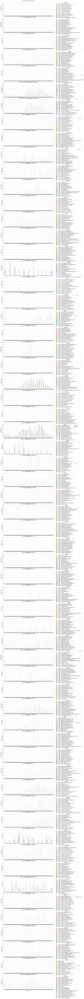

In [31]:
# Assuming your aggregated data is stored in a DataFrame named 'df_aggregated'

# Set the style for better aesthetics (optional)
sns.set(style="whitegrid")

# Create a figure and axis with subplots
fig, axes = plt.subplots(nrows=len(df['city'].unique()), ncols=1, figsize=(12, 4 * len(df['city'].unique())))

# Loop through each city and create a stacked bar chart
for i, city in enumerate(df['city'].unique()):
    city_data = df[df['city'] == city]
    
    sns.barplot(x='hour_of_day', y='qty_sold', hue='product', data=city_data, ax=axes[i])
    
    # Customize the chart
    axes[i].set_title(f'Hourly Sales by Product - {city}')
    axes[i].set_xlabel('Hour of Day')
    axes[i].set_ylabel('Quantity Sold')
    axes[i].legend(title='Product', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


In [41]:


# Assuming your aggregated data is stored in a DataFrame named 'df_aggregated'

# Create a color scale for products
color_scale = sns.color_palette("husl", n_colors=len(df_aggregated['product'].unique())).as_hex()

# Create subplots
fig = sp.make_subplots(rows=len(df_aggregated['city'].unique()), cols=1,
                       subplot_titles=[f'Hourly Sales by Product - {city}' for city in df_aggregated['city'].unique()],
                       shared_xaxes=True, vertical_spacing=0.1)

# Loop through each city and create a stacked bar chart
for i, city in enumerate(df_aggregated['city'].unique()):
    city_data = df_aggregated[df_aggregated['city'] == city]
    
    # Map each product to a color using the color scale
    color_mapping = dict(zip(city_data['product'].unique(), color_scale))
    city_data['color'] = city_data['product'].map(color_mapping)
    
    # Create the stacked bar chart for each city
    trace = go.Bar(x=city_data['hour_of_day'], y=city_data['qty_sold'], marker_color=city_data['color'],
                   hovertext=city_data['product'], showlegend=False)
    
    # Add the trace to the subplot
    fig.add_trace(trace, row=i + 1, col=1)

# Customize the layout
fig.update_layout(barmode='stack', yaxis_title='Quantity Sold', height=800)

# Set the angle for the x-axis title to be vertical
fig.update_xaxes(title_text='Hour of Day', tickangle=-90)

# Show the plot
fig.show()


C:\Users\zaida\AppData\Local\Temp\ipykernel_11020\2290105166.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\zaida\AppData\Local\Temp\ipykernel_11020\2290105166.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\zaida\AppData\Local\Temp\ipykernel_11020\2290105166.py:17: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pa